# For the code to work...

1. Download the dataset and weights
2. Replace the paths to 1) the weights file and 2) the dataset folders in the "Launch parameters" and "Metric output" blocks respectively.
3. The code is ready to run!

# Imports

In [ ]:
# Install necessary libraries
!pip install ultralytics
!pip install jdc
!pip install optuna

In [ ]:
# Import necessary libraries
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
from ultralytics import YOLO
import json
from math import sin, cos, radians, pi, sqrt, atan2, degrees
import jdc
import optuna
from sklearn.metrics import mean_absolute_percentage_error
from PIL import Image as PIL_Image
from random import randint
from google.colab.patches import cv2_imshow
import contextlib
import io

In [ ]:
# Mount Google Drive to access files
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


# Tested function

Parameters for model operation

In [ ]:
# Parameters for model operation and filtering
# CHECK ON CLOSENESS TO BORDER
max_close_to_border = 3

# OVERLAP
min_neighbors_distance_ellipse = 1.2
min_neighbors_distance_rectangle = 1
add_to_radius_coef = 1.2

# REMOVE BIG
max_area_diff = [3, 6, 6, 6] # Maximum allowed difference in area

# REMOVE
max_width_coef = 0.7
width_height_min_coef = 1.7

# BUILDING GRAPH
max_radius_diff_in_line = 1.5
max_distance_in_line = 1.2

# AUTOSELECT
extension_percent = 0.05

# CHECKING BLUR
blur_threshold = 400

# CHECKING ANGLE
angle_threshold = 1.3

## Computational functions

In [ ]:
# Calculate the distance between two points
def distance(p1, p2):
    res = ((p2[0]-p1[0])**2 + (p2[1]-p1[1])**2) ** 0.5
    if res == 0:
        return 0.001
    else:
        return res

# Fit an ellipse to a bounding box
def fit_ellipse(bbox):
    x, y, w, h = bbox
    center = (int(x + w/2), int(y + h/2))
    axes = (int(w/2), int(h/2))
    angle = 0
    return (center, axes, angle)

## Pipe classes

In [ ]:
# Base class for pipes
class Pipes():
    def __init__(self):
        self.neighbors = []
        self.batch = -1

# Class for Ellipse pipes
class Ellipse(Pipes):
    def __init__(self, bbox: list):
        super().__init__()
        self.box = [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]]
        self.bbox = bbox
        self.center, self.axes, self.angle = fit_ellipse(bbox)

        self.min_axe = min(self.axes)
        self.max_axe = max(self.axes)
        self.axes_ratio = self.max_axe / self.min_axe
        self.area = pi * self.axes[0] * self.axes[1] / 4
        self.radius = (self.axes[0] + self.axes[1]) / 2

        self.color = [0, 255, 0]

    # Check for overlap with another ellipse
    def check_overlap(self, another, bigger_size=True):
        radius_check = max(self.radius, another.radius)

        if remove_overlap == False:
            return "add"

        # Check if the center coincides with existing centers (with tolerance - radius)
        if abs(another.center[0] - self.center[0]) < min_neighbors_distance_ellipse * radius_check and abs(another.center[1] - self.center[1]) < min_neighbors_distance_ellipse * radius_check:
            if bigger_size:
                # If the new contour is larger than the existing one, replace the existing one
                if self.area > another.area:
                    return "replace"
                return "ignore"
        else:
            return "add"

    # Draw the ellipse on an image
    def draw(self, draw_img):
        cv2.ellipse(draw_img, self.center, self.axes, self.angle, 0, 360, self.color, 2)
        return draw_img

    # Draw a mask of the ellipse on an image
    def draw_mask(self, draw_img):
        cv2.ellipse(draw_img, self.center, self.axes, self.angle, 0, 360, (255, 255, 255), -1)
        return draw_img

# Class for Rectangle pipes
class Rectangle(Pipes):
    def __init__(self, bbox: list):
        super().__init__()
        self.box = [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]]
        self.bbox = bbox
        self.width = bbox[2]
        self.height = bbox[3]

        self.start_point = (bbox[0], bbox[1])
        self.end_point = (bbox[0] + self.width, bbox[1] + self.height)

        self.area = self.width * self.height
        self.radius = max(self.width, self.height) / 2
        self.center = (int((self.start_point[0] + self.end_point[0])/2), int((self.start_point[1] + self.end_point[1])/2))

        self.color = [255, 207, 0]

    # Check for overlap with another rectangle
    def check_overlap(self, another, bigger_size=True):
        if self.area > another.area:
            max_rect = self
            min_rect = another
        else:
            max_rect = another
            min_rect = self

        x_min_distance = max((max_rect.start_point[0] - min_rect.center[0]), (min_rect.center[0] - max_rect.end_point[0]))
        y_min_distance = max((max_rect.start_point[1] - min_rect.center[1]), (min_rect.center[1] - max_rect.end_point[1]))

        if remove_overlap == False:
            return "add"

        # Check if the center coincides with existing centers (with tolerance - radius)
        if (x_min_distance < (min_neighbors_distance_rectangle - 1) * max_rect.width) and (y_min_distance < (min_neighbors_distance_rectangle - 1) * max_rect.height):
            if bigger_size:
                # If the new contour is larger than the existing one, replace the existing one
                if self.area > another.area:
                    return "replace"
                return "ignore"
        else:
            return "add"

    # Draw the rectangle on an image
    def draw(self, draw_img):
        cv2.rectangle(draw_img, self.start_point, self.end_point, self.color, 2)
        return draw_img

    # Draw a mask of the rectangle on an image
    def draw_mask(self, draw_img):
        cv2.rectangle(draw_img, self.start_point, self.end_point, (255, 255, 255), -1)
        return draw_img

# Class for Angle pipes
class Angle(Pipes):
    def __init__(self, bbox: list):
        super().__init__()
        self.box = [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]]
        self.bbox = bbox
        self.width = bbox[2]
        self.height = bbox[3]

        self.start_point = (bbox[0], bbox[1])
        self.end_point = (bbox[0] + self.width, bbox[1] + self.height)

        self.area = self.width * self.height
        self.radius = max(self.width, self.height) / 2
        self.center = (int((self.start_point[0] + self.end_point[0])/2), int((self.start_point[1] + self.end_point[1])/2))

        self.color = [randint(100, 255), randint(100, 255), randint(100, 255)]

    # Draw the angle bounding box on an image
    def draw(self, draw_img):
        cv2.rectangle(draw_img, self.start_point, self.end_point, self.color, 2)
        return draw_img

    # Draw a mask of the angle bounding box on an image
    def draw_mask(self, draw_img):
        cv2.rectangle(draw_img, self.start_point, self.end_point, (255, 255, 255), -1)
        return draw_img

# Class for Channel pipes
class Channel():
    def __init__(self, bbox: list):
        super().__init__()
        self.box = [bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]]
        self.bbox = bbox
        self.width = bbox[2]
        self.height = bbox[3]

        self.start_point = (bbox[0], bbox[1])
        self.end_point = (bbox[0] + self.width, bbox[1] + self.height)

        self.area = self.width * self.height
        self.radius = max(self.width, self.height) / 2
        self.center = (int((self.start_point[0] + self.end_point[0])/2), int((self.start_point[1] + self.end_point[1])/2))

        self.color = [randint(100, 255), randint(100, 255), randint(100, 255)]

    # Draw the channel bounding box on an image
    def draw(self, draw_img):
        cv2.rectangle(draw_img, self.start_point, self.end_point, self.color, 2)
        return draw_img

    # Draw a mask of the channel bounding box on an image
    def draw_mask(self, draw_img):
        cv2.rectangle(draw_img, self.start_point, self.end_point, (255, 255, 255), -1)
        return draw_img

## Helper functions

In [ ]:
# Adjust bounding box coordinates based on image part offset
def adjust_box_coordinates(box, part_offset_x, part_offset_y):
    x1, y1, x2, y2 = map(int, box)
    return [x1 + part_offset_x, y1 + part_offset_y,
            x2 + part_offset_x, y2 + part_offset_y]

# Check for overlap between pipes and remove duplicates or smaller boxes
def check_overlap(massive, bigger_size=True):
    new_massive = []
    for i in range(len(massive)):
        cnt = massive[i]
        flag = True
        for j in range(len(new_massive)):
            set_cnt = new_massive[j]
            action = cnt.check_overlap(set_cnt, bigger_size)
            if action == "replace":
                new_massive[j] = cnt
                flag = False
            elif action == "ignore":
                flag = False

        if flag:
            new_massive.append(cnt)

    return new_massive

# Check if a pipe is too close to the image border
def check_borders(pipe):
    if not checking_border:
        return True

    down = img_size[1] - pipe.box[3]
    up = pipe.box[1]
    left = pipe.box[0]
    right = img_size[0] - pipe.box[2]
    koef = min(down, left, up, right)
    if koef < max_close_to_border:
        return False
    else:
        return True

## Main image processing function

In [ ]:
# Divide the image into parts, perform inference, and collect pipe detections
def divide_image(original_image: np.ndarray, pipe_type: int, num_division:int, lap: int) -> list:
    global img_size
    image_for_drawing = original_image.copy()
    mask_image = np.zeros_like(original_image)

    height, width, _ = original_image.shape
    img_size = [width, height]

    part_h = height // num_division
    part_w = width // num_division

    images = []
    settings = []

    n = 0
    for i in range(num_division):
        for j in range(num_division):

            x_min = max(0, part_w * j - lap)
            x_max = min(width, part_w * (j+1) + lap)
            y_min = max(0, part_h * i - lap)
            y_max = min(height, part_h * (i+1) + lap)
            crop_img = original_image[y_min:y_max, x_min:x_max]
            images.append(crop_img)
            settings.append([x_min, y_min])
            n += 1

    pipes = []

    for index, image in enumerate(images):
        prediction = model(image)

        boxes = prediction[0].boxes.xyxy.cpu().numpy()
        classes = prediction[0].boxes.cls.cpu().numpy()

        if len(boxes) == 0:
            continue

        # Find the median area for filtering
        areas = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])

        median_area = np.median(areas[classes == pipe_type])


        for p in range(len(boxes)):
            box = boxes[p]
            cls = int(classes[p])
            x1, y1, x2, y2 = adjust_box_coordinates(box, *settings[index])
            bbox = [x1, y1, x2 - x1, y2 - y1]

            isflag = True
            if cls == 0 and (pipe_type == 0 or show_only_need_type == False):
                pipe = Ellipse(bbox)
            elif cls == 1 and (pipe_type == 1 or show_only_need_type == False):
                pipe = Rectangle(bbox)
            elif cls == 2 and (pipe_type == 2 or show_only_need_type == False):
                pipe = Angle(bbox)
            elif cls == 3 and (pipe_type == 3 or show_only_need_type == False):
                pipe = Channel(bbox)
            else:
                isflag = False

            if isflag:

                area = pipe.area
                if ((bbox[2] * bbox[3]))/(median_area) <= max_area_diff[pipe_type] or remove_big == False:
                    if check_borders(pipe) or (is_used_for_app == True):
                        pipes.append(pipe)

    if num_division > 1 and (pipe_type == 0 or pipe_type == 1):
        pipes = check_overlap(pipes)

    return pipes

## Inference function

In [ ]:
# Process a cropped image part and draw detected pipes
def process_cropped_image(full_image: np.array, masked_image: np.array, pipe_type: int) -> tuple[np.array, int]:
    # Divide the image (or process the whole image if num_division=1) and get detected pipes
    pipes = divide_image(masked_image, pipe_type, 1, 0)

    # Draw the detected pipes on the original image
    for p in pipes:
        full_image = p.draw(full_image)

    # Return the image with drawings and the count of detected pipes
    return [full_image, len(pipes)]

## Launch parameters

**! Insert the path to the weights in quotes into the value of the *weights_path* variable!**

In [ ]:
weights_path = '/content/drive/MyDrive/weights/all/best_50_nosynt.pt' # Path to the weights file

In [ ]:
# Model configuration parameters
show_only_need_type = True # Flag to show only the specified pipe type
remove_overlap = True # Flag to remove overlapping detections
remove_big = True # Flag to remove detections that are too large
checking_border = False # Flag to check if detections are too close to the border
remove_squares_in_rectangles = False # Flag to remove square-like detections within rectangles (currently unused)
save_to_results = False # Flag to save results (currently unused)

is_used_for_app = False # Flag indicating if the code is used in an application context

# Load the YOLO model with the specified weights
model = YOLO(weights_path)

# Functions for quality assessment

In [ ]:
# Function to test Mean Absolute Percentage Error (MAPE)
def test_mape(folder_path: str, pipe_type: int) -> float:
    """
    Calculate the average MAPE (Mean Absolute Percentage Error) for the number of pipes of a specific class (pipe_type)
    in all images in the folder.

    Parameters:
        folder_path (str): Path to the dataset folder containing 'images' and 'labels' subfolders.
        pipe_type (int): The class of pipes to evaluate.

    Returns:
        float: The average MAPE across all images. Returns NaN if no images are processed.
    """
    images_path = os.path.join(folder_path, 'images')
    labels_path = os.path.join(folder_path, 'labels')
    mape_values = []

    # Iterate through each image file in the images folder
    for image_file in os.listdir(images_path):
        if image_file.endswith(('.jpg', '.png', '.jpeg')):
            image_path = os.path.join(images_path, image_file)
            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(labels_path, label_file)

            # Skip if the corresponding label file does not exist
            if not os.path.exists(label_path):
                continue

            # Load the image
            full_image = cv2.imread(image_path)
            print(label_path)
            # Count the actual number of pipes of the specified type from the label file
            with open(label_path, 'r') as file:
                actual_count = sum(1 for line in file if line.startswith(str(pipe_type)))

            # Get the predicted count using the image processing function
            masked_image = full_image.copy()  # Create a copy for masking
            image, predicted_count = process_cropped_image(full_image, masked_image, pipe_type)

            # Display the image with detections
            plt.imshow(image)
            plt.show()

            # Print actual and predicted counts
            print('actual:', [actual_count], 'predicted:', [predicted_count])

            # Calculate MAPE for the current image if actual count is greater than 0
            if actual_count > 0:
                mape = mean_absolute_percentage_error([actual_count], [predicted_count])
                mape_values.append(mape)

    # Calculate and return the average MAPE across all processed images
    # Returns NaN if no MAPE values were calculated (e.g., no images with actual_count > 0)
    return np.mean(mape_values) * 100 if mape_values else float('nan')

# Metric output

Explanation

The evaluation function takes two parameters as input:

1. Dataset path

Insert the path to the dataset of angles (in quotes, as a string) into the value of the **angles_path** variable.

Insert the path to the dataset of channels (in quotes, as a string) into the value of the **channels_path** variable.

2. **Pipe type** for recognition and evaluation

* 0 - Round pipes
* 1 - Rectangular pipes
* 2 - Angles
* 3 - Channels

In [ ]:
# Paths to the datasets
angles_path = '/content/drive/MyDrive/test_angles_channels/angles/' # Path to the dataset with angles
channels_path = '/content/drive/MyDrive/test_angles_channels/channels/' # Path to the dataset with channels

/content/drive/MyDrive/test_angles_channels/angles/labels/m-s-angle-01.txt

0: 416x640 120 class_2s, 145.3ms
Speed: 4.7ms preprocess, 145.3ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


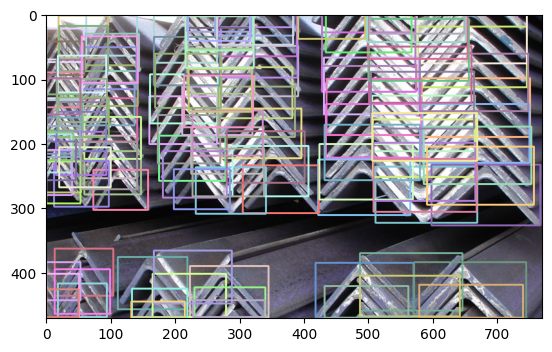

actual: [78] predicted: [120]
/content/drive/MyDrive/test_angles_channels/angles/labels/full_112.txt

0: 640x640 11 class_2s, 269.3ms
Speed: 6.4ms preprocess, 269.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


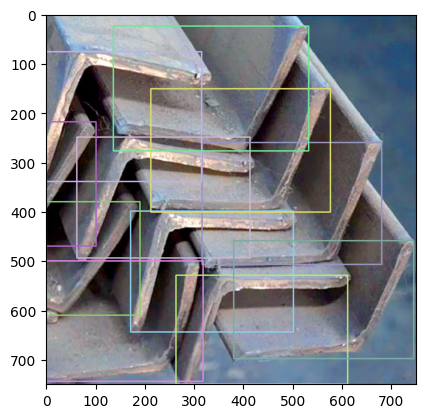

actual: [10] predicted: [11]
/content/drive/MyDrive/test_angles_channels/angles/labels/img-20220308-wa0024-1 - 500x500.txt

0: 544x640 52 class_2s, 239.7ms
Speed: 4.9ms preprocess, 239.7ms inference, 1.6ms postprocess per image at shape (1, 3, 544, 640)


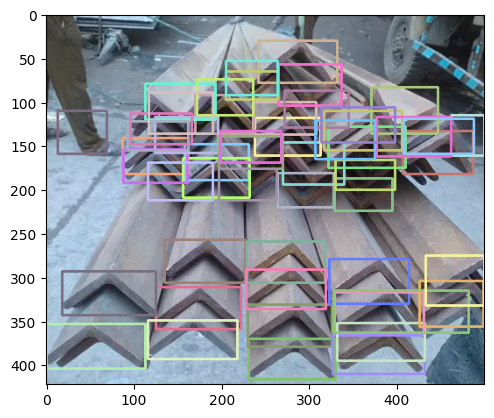

actual: [42] predicted: [52]
/content/drive/MyDrive/test_angles_channels/angles/labels/p201707061030141867364.txt

0: 512x640 49 class_2s, 262.0ms
Speed: 5.1ms preprocess, 262.0ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)


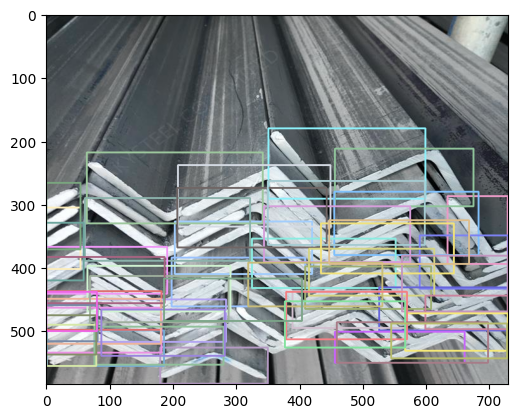

actual: [23] predicted: [49]
/content/drive/MyDrive/test_angles_channels/angles/labels/ms-angle-500x500.txt

0: 480x640 29 class_2s, 227.7ms
Speed: 4.4ms preprocess, 227.7ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


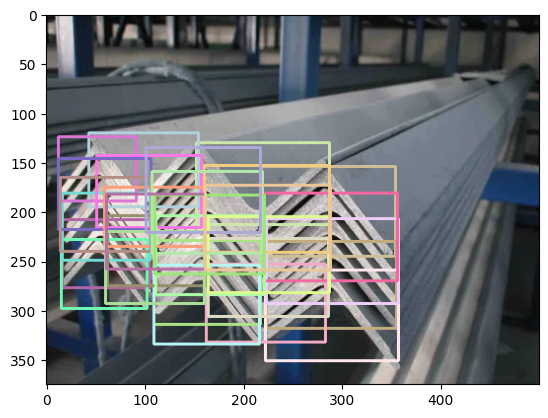

actual: [19] predicted: [29]
/content/drive/MyDrive/test_angles_channels/angles/labels/754_original.txt

0: 480x640 29 class_2s, 224.3ms
Speed: 7.3ms preprocess, 224.3ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


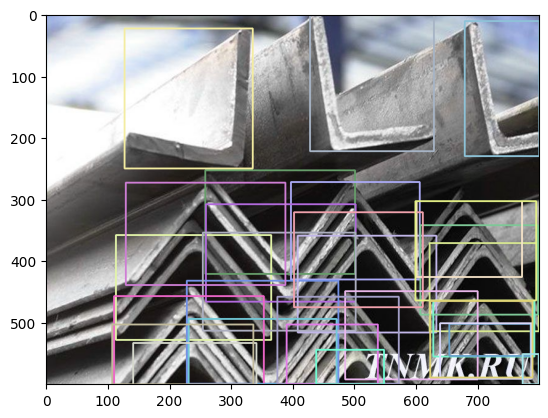

actual: [29] predicted: [29]
/content/drive/MyDrive/test_angles_channels/angles/labels/close-up-image-angle-metal-pile-angle-metal-background-160325005.txt

0: 448x640 88 class_2s, 206.1ms
Speed: 4.8ms preprocess, 206.1ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


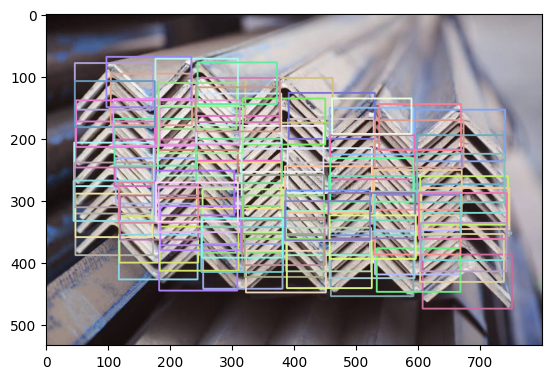

actual: [95] predicted: [88]
/content/drive/MyDrive/test_angles_channels/angles/labels/i (9).txt

0: 480x640 102 class_2s, 215.6ms
Speed: 5.7ms preprocess, 215.6ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


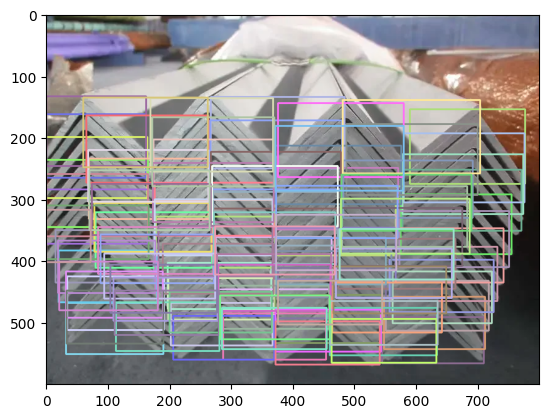

actual: [93] predicted: [102]
/content/drive/MyDrive/test_angles_channels/angles/labels/Razmeryi-metallicheskogo-ugolka-29.txt

0: 512x640 35 class_2s, 250.8ms
Speed: 12.3ms preprocess, 250.8ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


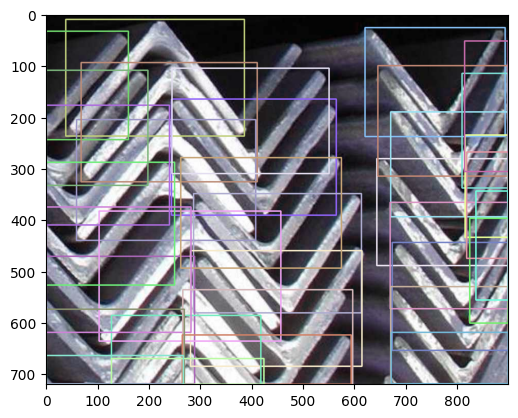

actual: [22] predicted: [35]
/content/drive/MyDrive/test_angles_channels/angles/labels/M_height (1).txt

0: 352x640 28 class_2s, 197.6ms
Speed: 3.8ms preprocess, 197.6ms inference, 1.5ms postprocess per image at shape (1, 3, 352, 640)


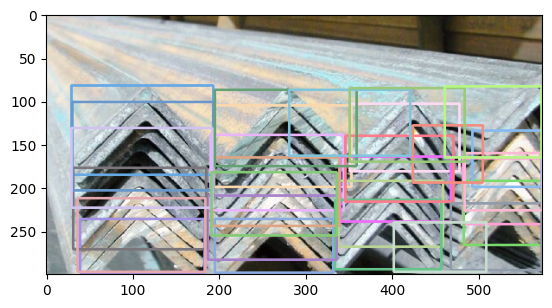

actual: [33] predicted: [28]
/content/drive/MyDrive/test_angles_channels/angles/labels/_6102302499650 (1).txt

0: 640x640 19 class_2s, 346.4ms
Speed: 9.5ms preprocess, 346.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


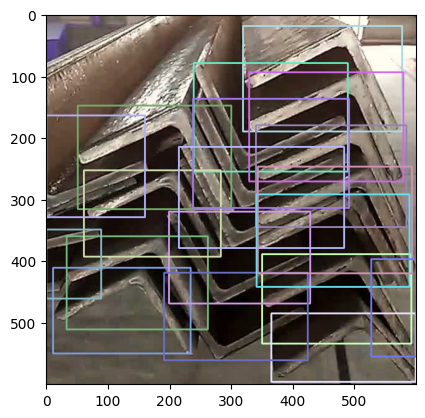

actual: [16] predicted: [19]
/content/drive/MyDrive/test_angles_channels/angles/labels/Hot-Rolled-201-304-316L-430-Stainless-Steel-Unequal-Equal-Angle-Steel-Bar-Price.txt

0: 640x640 70 class_2s, 331.9ms
Speed: 13.2ms preprocess, 331.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


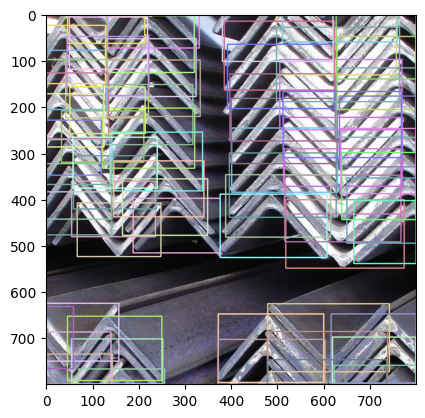

actual: [60] predicted: [70]
/content/drive/MyDrive/test_angles_channels/angles/labels/O1CN01tkzfUj1GbAC37ghTJ_!!6000000000640-0-tbvideo.txt

0: 384x640 300 class_2s, 250.6ms
Speed: 9.3ms preprocess, 250.6ms inference, 3.8ms postprocess per image at shape (1, 3, 384, 640)


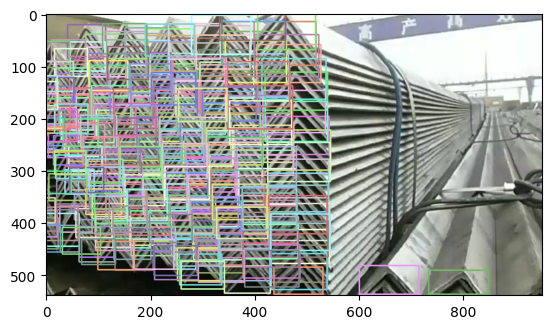

actual: [186] predicted: [300]
/content/drive/MyDrive/test_angles_channels/angles/labels/file_6_1.txt

0: 640x640 81 class_2s, 364.9ms
Speed: 12.9ms preprocess, 364.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


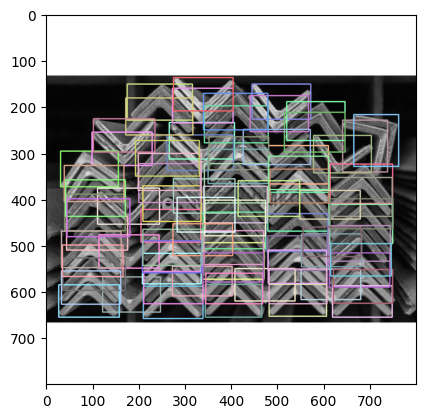

actual: [81] predicted: [81]
/content/drive/MyDrive/test_angles_channels/angles/labels/XXXL.txt

0: 448x640 107 class_2s, 232.0ms
Speed: 5.3ms preprocess, 232.0ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


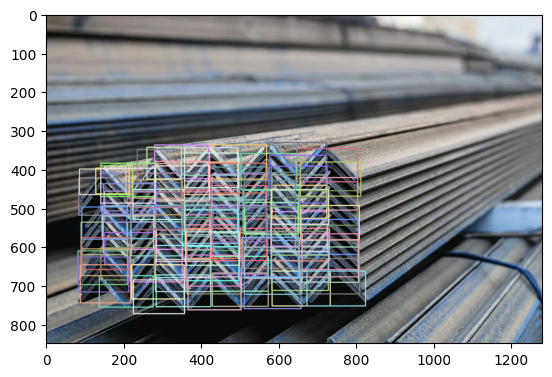

actual: [82] predicted: [107]
/content/drive/MyDrive/test_angles_channels/angles/labels/WhatsApp-Image-2021-10-10-at-16.33.30-1.txt

0: 448x640 29 class_2s, 273.8ms
Speed: 7.7ms preprocess, 273.8ms inference, 4.2ms postprocess per image at shape (1, 3, 448, 640)


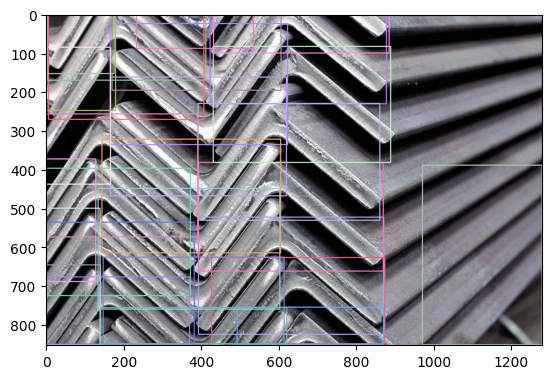

actual: [18] predicted: [29]
/content/drive/MyDrive/test_angles_channels/angles/labels/Ugolok-stalnoy-ravnopolochnyy-70kh70kh6-mm-09G2C-GOST-8509-93.txt

0: 480x640 166 class_2s, 264.9ms
Speed: 9.8ms preprocess, 264.9ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


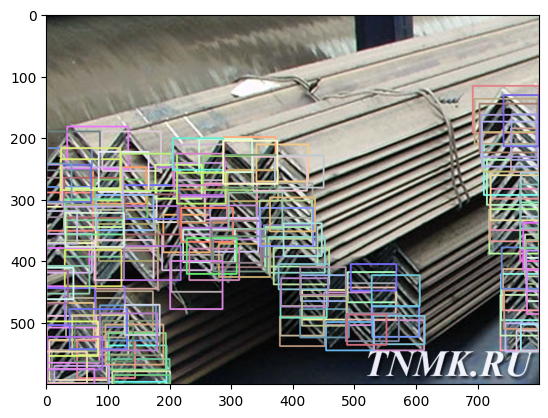

actual: [121] predicted: [166]
/content/drive/MyDrive/test_angles_channels/angles/labels/XXL_height (3).txt

0: 320x640 49 class_2s, 202.3ms
Speed: 3.1ms preprocess, 202.3ms inference, 6.4ms postprocess per image at shape (1, 3, 320, 640)


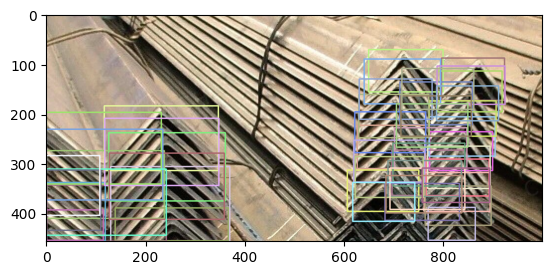

actual: [43] predicted: [49]
/content/drive/MyDrive/test_angles_channels/angles/labels/Ugolok-stalnoy-ravnopolochnyy-110kh110kh7-mm-st.-3sp3ps-GOST-8509-93.txt

0: 480x640 109 class_2s, 220.2ms
Speed: 4.7ms preprocess, 220.2ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


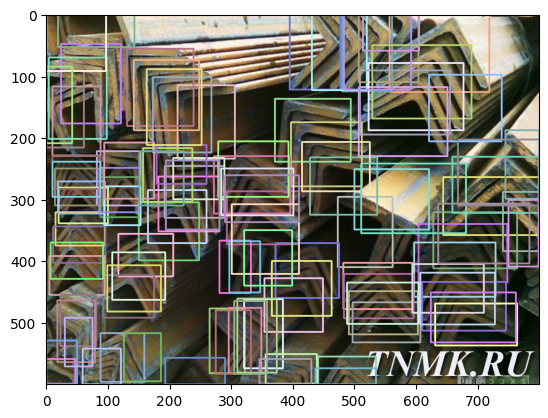

actual: [119] predicted: [109]
Итоговый MAPE: 31.18272826902847


In [ ]:
# Calculate and print the final MAPE for angles (pipe type 2)
print(f"Final MAPE: {test_mape(angles_path, 2)}")

/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 130_channel3.txt

0: 640x640 47 class_3s, 321.1ms
Speed: 5.8ms preprocess, 321.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


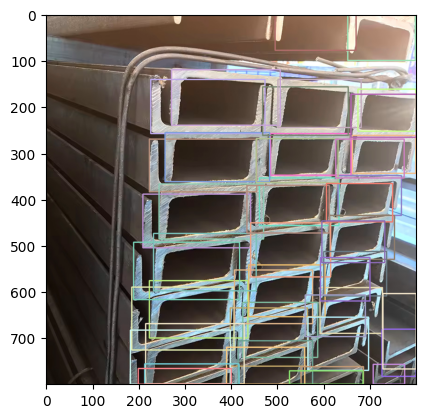

actual: [37] predicted: [47]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 22_channel3.txt

0: 640x640 90 class_3s, 221.6ms
Speed: 6.0ms preprocess, 221.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


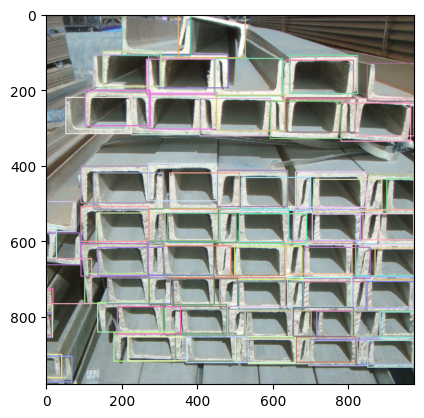

actual: [78] predicted: [90]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 72_channel3.txt

0: 640x640 179 class_3s, 216.8ms
Speed: 4.2ms preprocess, 216.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


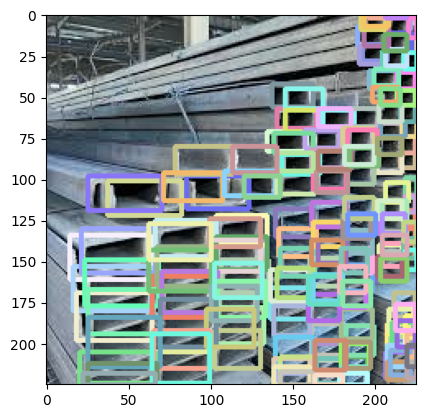

actual: [163] predicted: [178]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 89_channel3.txt

0: 640x640 48 class_3s, 252.9ms
Speed: 4.6ms preprocess, 252.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


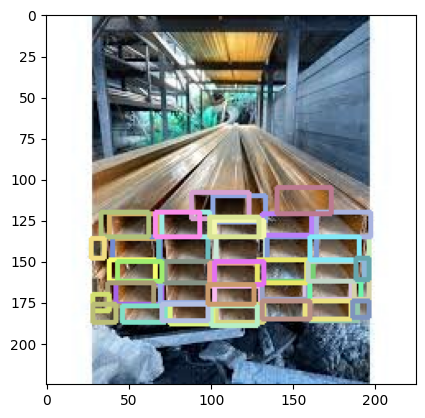

actual: [51] predicted: [48]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 129_channel3.txt

0: 640x640 40 class_3s, 204.5ms
Speed: 4.5ms preprocess, 204.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


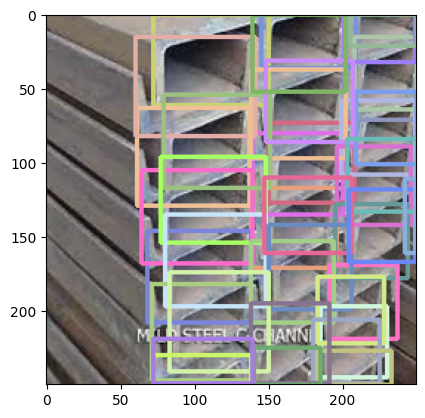

actual: [27] predicted: [40]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 121_channel3.txt

0: 640x640 124 class_3s, 251.9ms
Speed: 5.4ms preprocess, 251.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


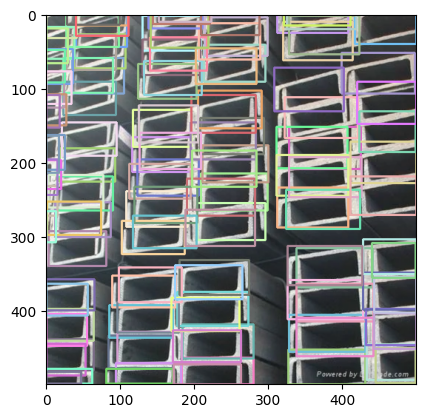

actual: [101] predicted: [124]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 134_channel3.txt

0: 640x640 42 class_3s, 229.9ms
Speed: 3.3ms preprocess, 229.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


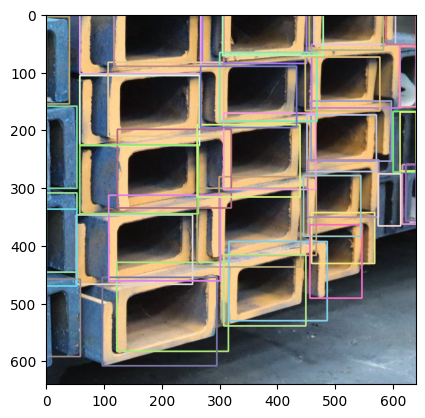

actual: [23] predicted: [42]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 81_channel3.txt

0: 640x480 300 class_3s, 215.2ms
Speed: 5.0ms preprocess, 215.2ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 480)


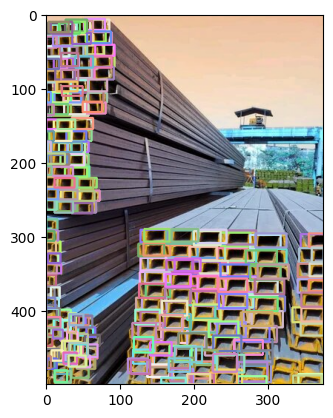

actual: [246] predicted: [300]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 19_channel3.txt

0: 640x640 70 class_1s, 263.6ms
Speed: 5.4ms preprocess, 263.6ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


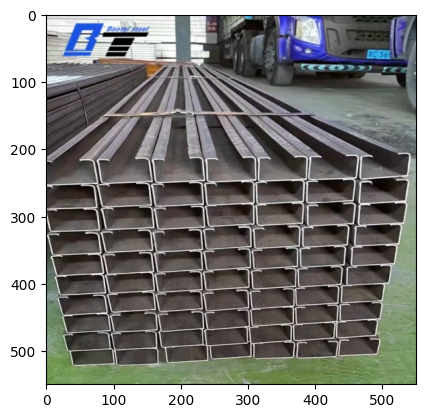

actual: [70] predicted: [0]
/content/drive/MyDrive/test_angles_channels/channels/labels/Copy of 139_channel3.txt

0: 640x640 2 class_1s, 1 class_2, 25 class_3s, 257.1ms
Speed: 6.0ms preprocess, 257.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


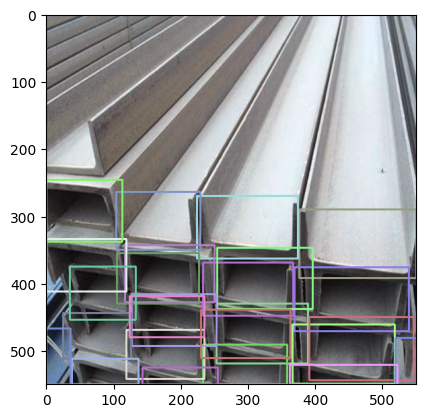

actual: [19] predicted: [25]
Итоговый MAPE: 36.455573724920995


In [ ]:
# Calculate and print the final MAPE for channels (pipe type 3)
print(f"Final MAPE: {test_mape(channels_path, 3)}")